In [1]:
import librosa
from IPython.display import Audio, display
import numpy as np
import tensorflow as tf
import pandas as pd
import seaborn as sb
from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from matplotlib import pyplot as plt
from sklearn.metrics import mean_squared_error

%matplotlib inline
output_notebook()

Loading BokehJS ...

In [2]:
# Choose sample rate
sr = 8000

# Load song as raw signal
raw, sr = librosa.core.load("/home/adrian/Music/Skrillex - First of the Year.mp3", sr=sr)
print("raw length = " + str(len(raw)))
print("sr = " + str(sr))
print(type(raw[0]))

raw length = 2091895
sr = 8000
<class 'numpy.float32'>


In [3]:
# Cast to 16-bit float
raw = raw.astype(np.float16, copy=False)

# Show signal properties
print("Number of points in the signal: " + str(len(raw)))
print("Elements in the signal: " + str(raw))
print("Minimum of the signal: " + str(min(raw)))
print("Maximum of the signal: " + str(max(raw)))
print("Mean of the signal: " + str(np.mean(raw)))
print("Stdev of the signal: " + str(np.std(raw)))

Number of points in the signal: 2091895
Elements in the signal: [  0.00000000e+00   0.00000000e+00   0.00000000e+00 ...,   2.38418579e-07
  -1.66893005e-06   0.00000000e+00]
Minimum of the signal: -0.9082
Maximum of the signal: 0.92041
Mean of the signal: 0.0026836
Stdev of the signal: inf


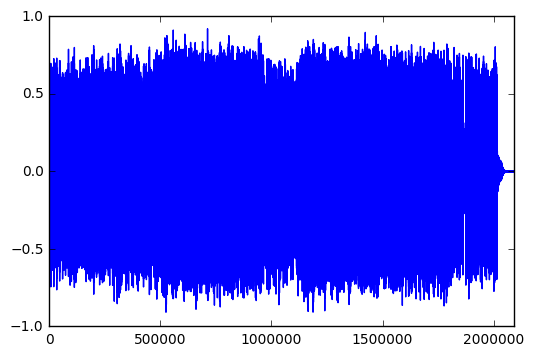

In [4]:
# Show signal and player
pd.Series(raw).plot()
display(Audio(raw, rate=sr))

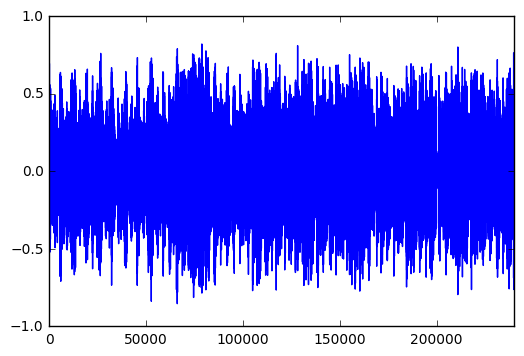

In [5]:
# Choose 30 segment30 of the signal
segment30 = raw[30*sr:60*sr]
pd.Series(segment30).plot()
display(Audio(segment30, rate=sr))

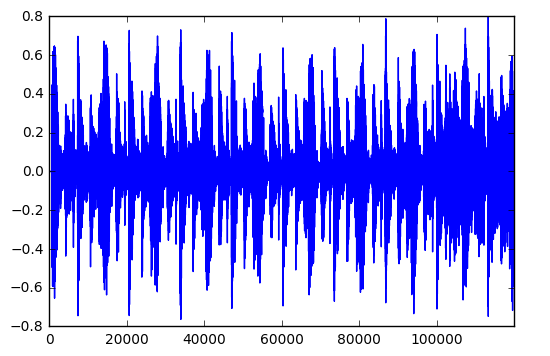

In [6]:
segment1 = raw[0*sr:15*sr]
pd.Series(segment1).plot()
display(Audio(segment1, rate=sr))

In [7]:
# Select random elements from the signal
data = pd.DataFrame(raw, columns=["raw_signal"])
data.sample(10)

,raw_signal
205779,0.063293
473732,0.045868
574027,0.574707
1356858,-0.121094
879657,0.119080
780202,-0.200684
1777106,0.079895
1385295,0.105164
161386,0.061401
113835,0.065979


In [8]:
# Code in tensorflow-lstm-regression

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.python.framework import dtypes
from tensorflow.contrib import learn as tflearn
from tensorflow.contrib import layers as tflayers


def x_sin(x):
    return x * np.sin(x)


def sin_cos(x):
    return pd.DataFrame(dict(a=np.sin(x), b=np.cos(x)), index=x)


def rnn_data(data, time_steps, labels=False):
    """
    creates new data frame based on previous observation
      * example:
        l = [1, 2, 3, 4, 5]
        time_steps = 2
        -> labels == False [[1, 2], [2, 3], [3, 4]]
        -> labels == True [2, 3, 4, 5]
    """
    rnn_df = []
    for i in range(len(data) - time_steps):
        if labels:
            try:
                rnn_df.append(data.iloc[i + time_steps].as_matrix())
            except AttributeError:
                rnn_df.append(data.iloc[i + time_steps])
        else:
            data_ = data.iloc[i: i + time_steps].as_matrix()
            rnn_df.append(data_ if len(data_.shape) > 1 else [[i] for i in data_])

    return np.array(rnn_df, dtype=np.float32)


def split_data(data, val_size=0.1, test_size=0.1):
    """
    splits data to training, validation and testing parts
    """
    ntest = int(round(len(data) * (1 - test_size)))
    nval = int(round(len(data.iloc[:ntest]) * (1 - val_size)))

    df_train, df_val, df_test = data.iloc[:nval], data.iloc[nval:ntest], data.iloc[ntest:]

    return df_train, df_val, df_test


def prepare_data(data, time_steps, labels=False, val_size=0.1, test_size=0.1):
    """
    Given the number of `time_steps` and some data,
    prepares training, validation and test data for an lstm cell.
    """
    df_train, df_val, df_test = split_data(data, val_size, test_size)
    return (rnn_data(df_train, time_steps, labels=labels),
            rnn_data(df_val, time_steps, labels=labels),
            rnn_data(df_test, time_steps, labels=labels))


def load_csvdata(rawdata, time_steps, seperate=False):
    data = rawdata
    if not isinstance(data, pd.DataFrame):
        data = pd.DataFrame(data)

    train_x, val_x, test_x = prepare_data(data['a'] if seperate else data, time_steps)
    train_y, val_y, test_y = prepare_data(data['b'] if seperate else data, time_steps, labels=True)
    return dict(train=train_x, val=val_x, test=test_x), dict(train=train_y, val=val_y, test=test_y)


def shuffle_with_state(arrlist):
    state = np.random.get_state()
    for arr in arrlist:
        np.random.set_state(state)
        np.random.shuffle(arr)
        
def generate_data(fct, x, time_steps, seperate=False, val_size=0.1, test_size=0.1, shuffle=False):
    """generates data with based on a function fct"""
    data = fct(x)
    if not isinstance(data, pd.DataFrame):
        data = pd.DataFrame(data)
    train_x, val_x, test_x = prepare_data(data['a'] if seperate else data, time_steps, val_size=val_size, test_size=test_size)
    train_y, val_y, test_y = prepare_data(data['b'] if seperate else data, time_steps, labels=True, val_size=val_size, test_size=test_size)
    
    if shuffle:
        shuffle_with_state([train_x, train_y])
        shuffle_with_state([val_x, val_y])
        
    return dict(train=train_x, val=val_x, test=test_x), dict(train=train_y, val=val_y, test=test_y)


def lstm_model(num_units, rnn_layers, dense_layers=None, learning_rate=0.1, optimizer='Adagrad'):
    """
    Creates a deep model based on:
        * stacked lstm cells
        * an optional dense layers
    :param num_units: the size of the cells.
    :param rnn_layers: list of int or dict
                         * list of int: the steps used to instantiate the `BasicLSTMCell` cell
                         * list of dict: [{steps: int, keep_prob: int}, ...]
    :param dense_layers: list of nodes for each layer
    :return: the model definition
    """

    def lstm_cells(layers):
        if isinstance(layers[0], dict):
            return [tf.nn.rnn_cell.DropoutWrapper(tf.nn.rnn_cell.BasicLSTMCell(layer['num_units'],
                                                                               state_is_tuple=True),
                                                  layer['keep_prob'])
                    if layer.get('keep_prob') else tf.nn.rnn_cell.BasicLSTMCell(layer['num_units'],
                                                                                state_is_tuple=True)
                    for layer in layers]
        return [tf.nn.rnn_cell.BasicLSTMCell(steps, state_is_tuple=True) for steps in layers]

    def dnn_layers(input_layers, layers):
        if layers and isinstance(layers, dict):
            return tflayers.stack(input_layers, tflayers.fully_connected,
                                  layers['layers'],
                                  activation=layers.get('activation'),
                                  dropout=layers.get('dropout'))
        elif layers:
            return tflayers.stack(input_layers, tflayers.fully_connected, layers)
        else:
            return input_layers

    def _lstm_model(X, y):
        stacked_lstm = tf.nn.rnn_cell.MultiRNNCell(lstm_cells(rnn_layers), state_is_tuple=True)
        x_ = tf.unpack(X, axis=1, num=num_units)
        output, layers = tf.nn.rnn(stacked_lstm, x_, dtype=dtypes.float32)
        output = dnn_layers(output[-1], dense_layers)
        prediction, loss = tflearn.models.linear_regression(output, y)
        train_op = tf.contrib.layers.optimize_loss(
            loss, tf.contrib.framework.get_global_step(), optimizer=optimizer,
            learning_rate=learning_rate)
        return prediction, loss, train_op

    return _lstm_model

In [9]:
LOG_DIR = './logs'
TIMESTEPS = 100
RNN_LAYERS = [{'num_units': 20}, {'num_units': 10}]
DENSE_LAYERS = None
TRAINING_STEPS = 10000
EARLY_CHECKING = 1000
PRINT_STEPS = TRAINING_STEPS / 10
BATCH_SIZE = 100

In [10]:
X, y = generate_data(lambda x: x, data, TIMESTEPS, seperate=False, shuffle=True)

In [11]:
print(X.keys())
print(y.keys())

dict_keys(['test', 'val', 'train'])
dict_keys(['test', 'val', 'train'])


In [12]:
print("Train dataset shapes: " + str(X["train"].shape))
print("Test dataset shapes: " + str(X["test"].shape))
print("Val dataset shapes: " + str(X["val"].shape))

Train dataset shapes: (1694335, 100, 1)
Test dataset shapes: (209089, 100, 1)
Val dataset shapes: (188171, 100, 1)


In [13]:
p = figure(title="Sequence examples (chosen randomly)", x_axis_label='Time', y_axis_label='Value')

r = np.random.randint(X["train"].shape[0])
p.line(range(len(X["train"][r,:,0])), X["train"][r,:,0], legend="Train sample", line_width=2)
r = np.random.randint(X["test"].shape[0])
p.line(range(len(X["test"][r,:,0])), X["test"][r,:,0], legend="Test sample", line_color="green", line_width=2)
r = np.random.randint(X["val"].shape[0])
p.line(range(len(X["val"][r,:,0])), X["val"][r,:,0], legend="Validation sample", line_color="brown", line_width=2)

show(p)

In [14]:
p = figure(title="Input-Output example at consecutive times", x_axis_label='Time', y_axis_label='Value')

# create a line chart
i = 3000
p.line(range(len(X["test"][i,:,0])), X["test"][i,:,0], legend="Input_t"+str(i), line_width=2)
p.circle(len(X["test"][i,:,0]), y["test"][i,0], legend="Output_t0")

i = 3001
p.line(range(len(X["test"][i,:,0])), X["test"][i,:,0], legend="Input_t"+str(i), line_width=2, line_color="green")
p.circle(len(X["test"][i,:,0]), y["test"][i,0], legend="Output_t1", color="green")

# show the results
show(p)

In [15]:
regressor = tf.contrib.learn.Estimator(model_fn=lstm_model(TIMESTEPS, RNN_LAYERS, DENSE_LAYERS),
                            model_dir=LOG_DIR)

# create a lstm instance and validation monitor
validation_monitor = tf.contrib.learn.monitors.ValidationMonitor(X['val'], y['val'],
                                                      every_n_steps=PRINT_STEPS,
                                                      early_stopping_rounds=EARLY_CHECKING)
regressor.fit(X['train'], y['train'], 
              monitors=[validation_monitor], 
              batch_size=BATCH_SIZE,
              steps=TRAINING_STEPS)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'save_summary_steps': 100, 'save_checkpoints_secs': 600, '_environment': 'local', '_evaluation_master': '', 'keep_checkpoint_every_n_hours': 10000, 'tf_config': gpu_options {
  per_process_gpu_memory_fraction: 1
}
, 'tf_random_seed': None, 'save_checkpoints_steps': None, '_num_ps_replicas': 0, 'keep_checkpoint_max': 5, '_task_id': 0, '_master': '', '_task_type': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7fe695fd7630>, '_is_chief': True}
Instructions for updating:
Monitors are deprecated. Please use tf.train.SessionRunHook.
Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))
Instructions for updating:
Estimator is decoupled from

Estimator(params=None)

In [17]:
predicted = list(regressor.predict(X['test']))
#rmse = np.sqrt(((predicted - y['test']) ** 2).mean(axis=0))
score = mean_squared_error(predicted, y['test'])
print ("MSE: %f" % score)

Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))
Instructions for updating:
Use `tf.contrib.losses.mean_squared_error` and explicit logits computation.
INFO:tensorflow:Loading model from checkpoint: ./logs/model.ckpt-10001-?????-of-00001.
MSE: 0.003827


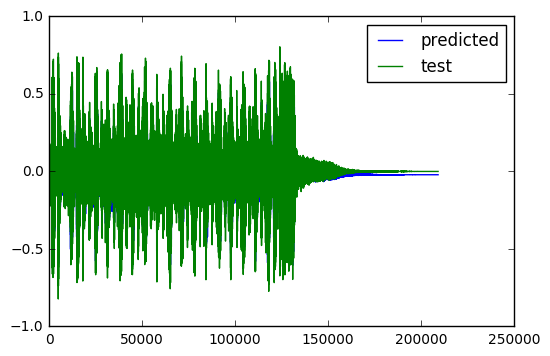

In [18]:
plot_predicted, = plt.plot(predicted, label='predicted')
plot_test, = plt.plot(y['test'], label='test')
plt.legend(handles=[plot_predicted, plot_test])

In [23]:
display(Audio(predicted, rate=sr))
display(Audio(y["test"][:, 0], rate=sr))

In [24]:
# Load song as raw signal
raw, sr = librosa.core.load("/home/adrian/Music/Skrillex - Cinema.mp3", sr=sr)
print("raw length = " + str(len(raw)))
print("sr = " + str(sr))
print(type(raw[0]))

raw length = 2440255
sr = 8000
<class 'numpy.float32'>


In [25]:
# Cast to 16-bit float
raw = raw.astype(np.float16, copy=False)

# Show signal properties
print("Number of points in the signal: " + str(len(raw)))
print("Elements in the signal: " + str(raw))
print("Minimum of the signal: " + str(min(raw)))
print("Maximum of the signal: " + str(max(raw)))
print("Mean of the signal: " + str(np.mean(raw)))
print("Stdev of the signal: " + str(np.std(raw)))

Number of points in the signal: 2440255
Elements in the signal: [ 0.  0.  0. ...,  0.  0.  0.]
Minimum of the signal: -1.0674
Maximum of the signal: 1.1084
Mean of the signal: -6.7174e-05
Stdev of the signal: inf


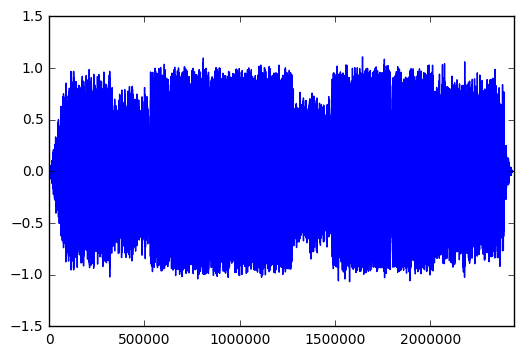

In [29]:
# Show signal and player
pd.Series(raw).plot()
display(Audio(raw, rate=sr))
display(Audio(raw[30*sr:60*sr], rate=sr))

In [30]:
# Select random elements from the signal
data = pd.DataFrame(raw[30*sr:60*sr], columns=["raw_signal"])
data.sample(10)

,raw_signal
141711,-0.309082
51194,-0.065430
717,-0.376953
81721,-0.153076
118478,0.131226
236019,0.360352
150396,-0.037262
200159,-0.100830
114610,-0.032166
124677,-0.487793


In [61]:
X, y = generate_data(lambda x: x, data, TIMESTEPS, seperate=False, shuffle=False)

In [34]:
predicted = list(regressor.predict(X["train"]))
score = mean_squared_error(predicted, y["train"])
print ("MSE: %f" % score)

Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))
Instructions for updating:
Use `tf.contrib.losses.mean_squared_error` and explicit logits computation.
INFO:tensorflow:Loading model from checkpoint: ./logs/model.ckpt-10001-?????-of-00001.
MSE: 0.021366


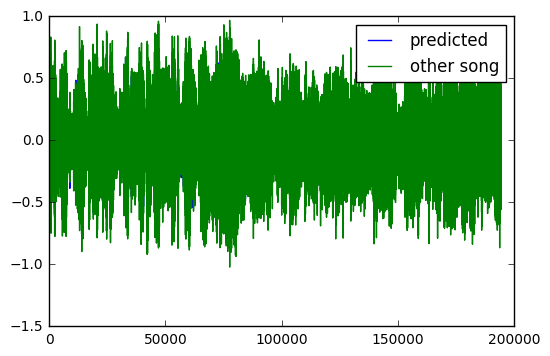

In [35]:
plot_predicted, = plt.plot(predicted, label='predicted')
plot_test, = plt.plot(y["train"], label='other song')
plt.legend(handles=[plot_predicted, plot_test])

In [36]:
display(Audio(predicted, rate=sr))
display(Audio(y["train"][:, 0], rate=sr))

In [62]:
X["train"].shape

(194300, 100, 1)

In [69]:
horizon = 200
seed = np.copy(X["train"][0:1, :, :])
result = list(seed[0,:,0])
for i in range(horizon):
    predicted = regressor.predict(seed)
    result.extend(list(predicted))
    seed[0,:,0] = np.array(result[i+1:])

Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))
Instructions for updating:
Use `tf.contrib.losses.mean_squared_error` and explicit logits computation.
INFO:tensorflow:Loading model from checkpoint: ./logs/model.ckpt-10001-?????-of-00001.
Instructions for updating:
Estimator is decoupled from Scikit Learn interface by moving into
separate class SKCompat. Arguments x, y and batch_size are only
available in the SKCompat class, Estimator will only accept input_fn.
Example conversion:
  est = Estimator(...) -> est = SKCompat(Estimator(...))
Instructions for updating:
Use `tf.contrib.losses.mean_squared_error` and explicit logits computation.
INFO:tensorflow:Loading model from checkpoint: ./logs/model.ckpt-10001-?????-of-00001.
Instructions

KeyboardInterrupt: 

In [72]:
data.shape

(240000, 1)

In [85]:
print(raw[30*sr+3:30*sr+126])
print(result)

[ 0.17871094  0.109375   -0.16064453  0.29638672  0.32275391 -0.12963867
 -0.11730957 -0.05981445 -0.34155273 -0.01846313 -0.14294434 -0.09820557
  0.11639404  0.08410645  0.10791016  0.1050415   0.02825928 -0.05053711
 -0.14440918 -0.37231445 -0.32055664 -0.33056641 -0.37084961 -0.23413086
  0.10516357 -0.22009277 -0.36230469  0.04833984  0.17419434 -0.20446777
 -0.35424805 -0.35205078 -0.45629883 -0.14355469 -0.48266602 -0.45751953
 -0.01641846 -0.02404785  0.11010742  0.03543091 -0.05090332 -0.00835419
 -0.24084473 -0.40112305 -0.35302734 -0.37158203 -0.24377441 -0.24951172
 -0.07495117  0.25390625  0.02510071  0.0847168   0.41381836  0.1159668
 -0.13452148 -0.11444092 -0.20654297 -0.25415039 -0.11248779 -0.04925537
  0.02410889  0.41113281  0.25488281  0.29394531  0.45019531  0.42675781
  0.39990234  0.12200928  0.03463745 -0.21875    -0.00993347  0.1159668
  0.12176514  0.54736328  0.59375     0.47729492  0.76318359  0.6171875
  0.34130859  0.27587891 -0.02851868  0.10791016  0.05

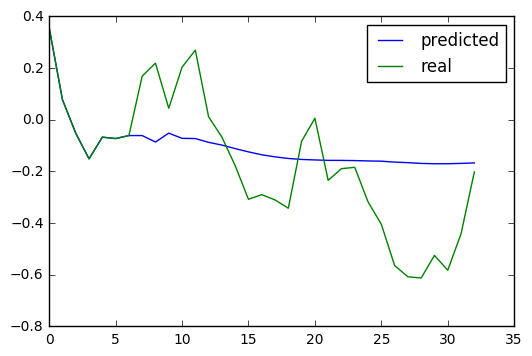

In [92]:
plot_predicted, = plt.plot(result[90:], label='predicted')
plot_test, = plt.plot(raw[30*sr+93:30*sr+126], label='real')
plt.legend(handles=[plot_predicted, plot_test])